# Рынок заведений общественного питания Москвы

**Описание данных**

Файл moscow_places.csv:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽».
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым:
  - 0 — заведение не является сетевым
  - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette('coolwarm')

import plotly.express as px 
from plotly import graph_objects as go

import folium
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster

import warnings
import json

## Загрузка данных и изучение информации

In [52]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [54]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


## Предобработка данных

In [55]:
#проверка на пропуски
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

У нас есть пропуске в столбцах: информация о днях и часах работы, категория цен в заведении, средняя стоимость заказа, «Средний счёт», "Цена одной чашки капучино" и количество посадочных мест - данные пропуски мы заполнить не сможем, так что будем работать с ними.

In [56]:
#доля пропусков
df.isna().sum()/df.shape[0]* 100

name                  0.000000
category              0.000000
address               0.000000
district              0.000000
hours                 6.376398
lat                   0.000000
lng                   0.000000
rating                0.000000
price                60.563883
avg_bill             54.603854
middle_avg_bill      62.538663
middle_coffee_cup    93.635498
chain                 0.000000
seats                42.957411
dtype: float64

In [57]:
#проверка на дубликаты
df.duplicated().sum()

0

In [58]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [59]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [60]:
df['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

In [61]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [62]:
df.query('chain == 1')['name'].unique()

array(['Иль Марко', 'Буханка', 'Пекарня', 'Чебуреки Манты', 'Drive Café',
       'В парке вкуснее', 'Кушай Город', 'Додо Пицца', "Домино'с Пицца",
       'Крошка Картошка', 'Кафетерий', '9 Bar Coffee', 'CofeFest',
       'БлинБери', 'Арамье', 'Cofix', 'Шашлык', "Coffeekaldi's",
       'Чебуречная история', 'Pizza Hut', 'Мимино', 'Веранда',
       'Хинкали-Gали!', 'Оазис', 'Му-Му', 'Coffee Way', 'Дежене',
       'Халяль', 'Гриль Хаус', 'Zамания', 'ЛавашОК', 'Тбилисоба',
       'Take and Wake', 'Pho Street', 'Теремок', 'Чайхана', 'Bowl Family',
       'Островок Суши', 'Сеть поминальных залов', 'Алло! Пицца',
       'Встреча', 'Шашлык Хаус', 'Кулинария', 'Арарат', 'Калина',
       'Крепери', 'Ho Chu Pho', 'Хинкальная', 'Шеф Бургер', 'Парус',
       'One Price Coffee', 'Скалка', 'КофеТун-СушиТун', 'Шоколадница',
       'Магбургер', 'Бистро 24', 'Яндекс Лавка', 'Wild bean cafe',
       'Шаурма на углях', 'Menza', 'Булкер', 'МосПлов', 'Донер Кебаб',
       'СушиСтор', 'ОШ', 'Wild Bean', 'Вос

In [63]:
#унифицируем некотрые назания заведений
df['name'] = df['name'].str.replace('Чайхана Ташкент', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Самарканд', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхона Айва', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхона № 1', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Баракат', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана 24', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Халаль', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхона', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Элина', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхона №1', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Халяль', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Манас', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана халяль', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Хан', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана ОШ', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана-24', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Азия', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Бишкек сити', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Халва', 'Чайхана', regex=True)
df['name'] = df['name'].str.replace('Чайхана Sabr', 'Чайхана', regex=True)

In [64]:
#избавимся от неявных дубликатов в названиях, если они есть
df['name'].str.title()

0                     Wowфли
1             Четыре Комнаты
2                      Хазри
3       Dormouse Coffee Shop
4                  Иль Марко
                ...         
8401              Суши Мания
8402               Миславнес
8403                 Самовар
8404                 Чайхана
8405              Kebab Time
Name: name, Length: 8406, dtype: object

In [65]:
df.query('chain == 0')['name'].duplicated().sum()

353

In [66]:
df.query('chain == 0')[df.duplicated(['name'])]
#видим, что это не дубликаты, а разные кафе с одинаковым названием

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
47,Кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0
141,Кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,0,70.0
159,Кафе,кафе,"Москва, Дмитровское шоссе, 163А",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.908830,37.538790,4.0,NaN,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7945,Кафе,кафе,"Москва, МКАД, 19-й километр, вл20с1",Южный административный округ,NaN,55.621773,37.781727,4.0,NaN,NaN,NaN,NaN,0,NaN
7976,Кафе,кафе,"Москва, МКАД, 19-й километр, вл12с1",Южный административный округ,NaN,55.616980,37.779312,4.3,NaN,NaN,NaN,NaN,0,NaN
7987,Ресторан,ресторан,"Москва, улица Маршала Захарова, 6, корп. 1",Южный административный округ,NaN,55.623680,37.704937,4.5,NaN,NaN,NaN,NaN,0,675.0
8133,Чайхана Райхан,ресторан,"Москва, Шарикоподшипниковская улица, 32",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.716197,37.676506,4.1,средние,Средний счёт:300 ₽,300.0,NaN,0,40.0


In [67]:
df[df.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2005,Чайхана,ресторан,"Москва, улица Сущёвский Вал, 3/5",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.793107,37.590237,4.3,NaN,NaN,NaN,NaN,1,22.0
7538,Чайхана,кафе,"Москва, Люблинская улица, 60",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.673731,37.738206,4.8,NaN,NaN,NaN,NaN,1,NaN


In [68]:
#добавим столбец с улицей
warnings.filterwarnings("ignore")

df['street'] = (df.address.str.split(', ').str[1]) 

In [69]:
#добавим столбец с информацией, работает ли кафе 24/7
df['is_24/7'] = df['hours'] == 'ежедневно, круглосуточно'  

Данные проверены, неявные дубликаты удалены, пропуски решено было оставить и не заполнять, в связи с особенностями информации, представленной в столбцах. 

Данные готовы к анализу.

## Анализ данных

### Исследуем количество объектов общественного питания по категориям:

In [71]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

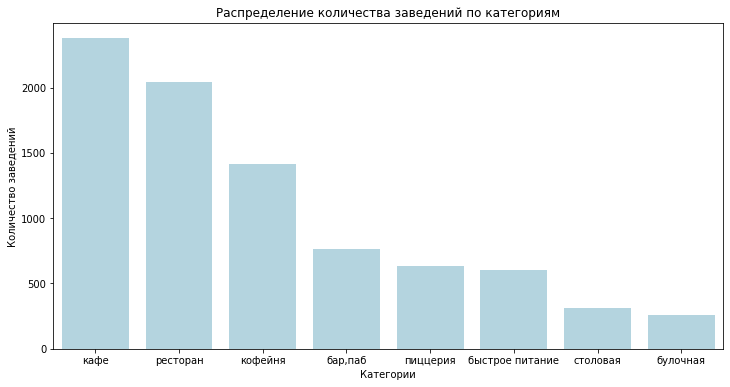

In [191]:
pivot_table = df.pivot_table(index='category', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=pivot_table, x='category', y='name', color='lightblue')

plt.title('Распределение количества заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.show()

Мы видим, что в топ-3 заведений по категориям входят: кафе, ресторан и кофейня (более тысячи заведений в каждой группе).

### Исследуем количество посадочных мест в местах по категориям:

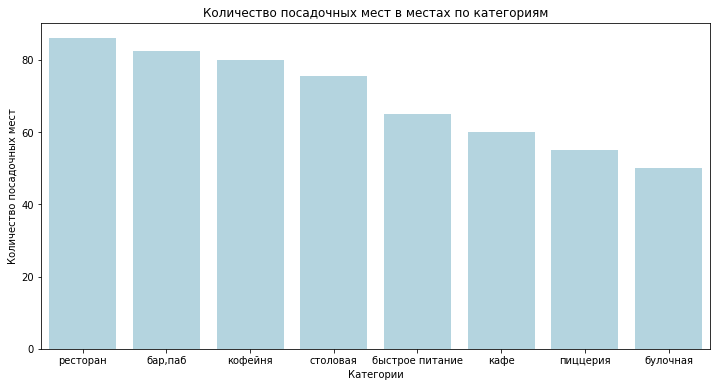

In [190]:
pivot_table = df.pivot_table(index='category', values='seats', aggfunc='median').reset_index().sort_values(by='seats', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=pivot_table, x='category', y='seats', color='lightblue')
plt.title('Количество посадочных мест в местах по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')
plt.show()

Больше всего посадочных мест в ресторанах, барах/пабах и кофейнях. Меньше всего посадочных мест в заведениях "на вынос"  - булочные, пиццерии.

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Какие категории заведений чаще являются сетевыми:

In [74]:
df['chain'] = df['chain'].replace(1, 'Сетевое')
df['chain'] = df['chain'].replace(0, 'Несетевое')

In [185]:
pivot_table = df.pivot_table(index='chain', values='name', aggfunc='count').reset_index()

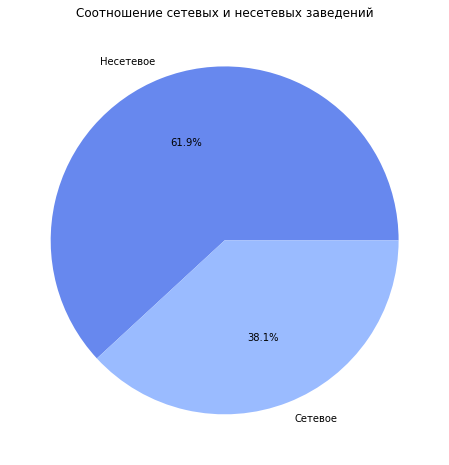

In [189]:
plt.figure(figsize=(8, 8))
plt.pie(pivot_table['name'], labels=pivot_table['chain'], colors=sns.color_palette('coolwarm'), autopct='%1.1f%%')

plt.title('Соотношение сетевых и несетевых заведений')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.axis('off')

plt.show()

В датасете 62% заведений являются несетевыми. 

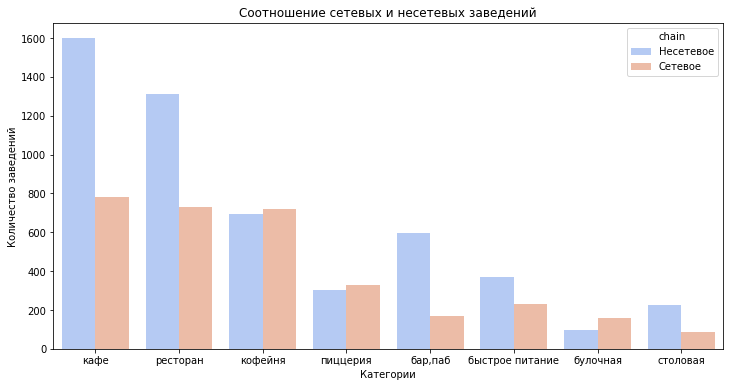

In [76]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.countplot(x='category', data=df, hue='chain', palette ='coolwarm')
plt.title('Соотношение сетевых и несетевых заведений')
plt.xlabel('Категории')
plt.ylabel('Количество заведений') 
plt.show()

Чтобы понять, какие категории заведений чаще являются сетевыми, посчитаем процент сетевых заведений от общего количества заведений каждого типа.

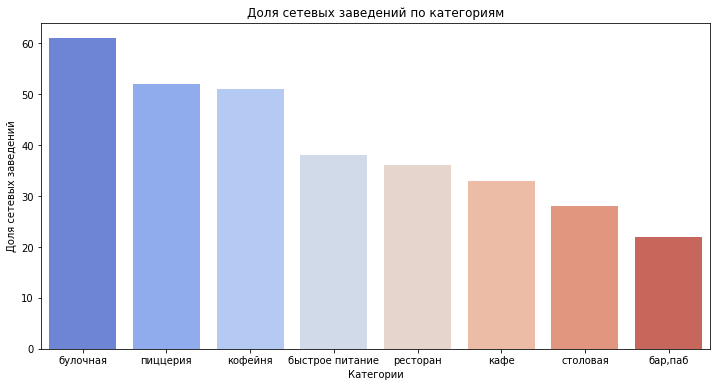

In [77]:
chain_share = (
    df.pivot_table(index='category', values='name', aggfunc='count').reset_index()
    .merge(df.query('chain == "Сетевое"').pivot_table(index='category', values='name', aggfunc='count')
           .reset_index(), left_on='category', right_on='category')
)

chain_share['share'] = round(chain_share['name_y'] / chain_share['name_x'] * 100)
chain_share = chain_share.sort_values(by='share', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=chain_share, x='category', y='share', palette ='coolwarm')
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Доля сетевых заведений')
plt.show()

Сетевых заведений больше всего в следующих категориях: булочная, пиццерия, кофейня

### Найдем топ-15 популярных сетей в Москве.

In [78]:
df['city'] = (df.address.str.split(', ').str[0]) 

In [79]:
top15_msc_chain = (
    df.query('chain == "Сетевое" & city == "Москва"').groupby('name').agg({'address':'count'})
    .sort_values(by='address', ascending=False).head(15).reset_index().rename(columns={'address': 'count'}))

In [80]:
top15_msc_chain

,name,count
0,Шоколадница,120
1,Чайхана,97
2,Домино'с Пицца,76
3,Додо Пицца,74
4,One Price Coffee,71
5,Яндекс Лавка,69
6,Cofix,65
7,Prime,50
8,Хинкальная,44
9,КОФЕПОРТ,42


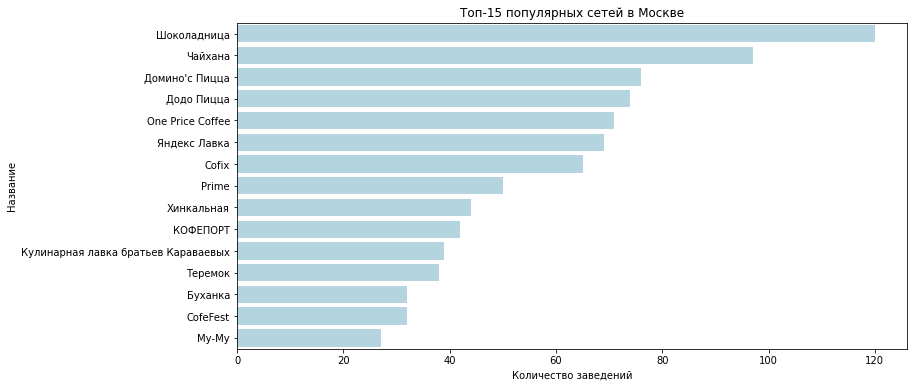

In [192]:
plt.figure(figsize=(12, 6))
sns.barplot(data=top15_msc_chain, x='count', y='name', color='lightblue')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Название')
plt.show()

Ожидаемый список заведений. Шоколадница, популярные пиццерии, кофейни с демократичными ценами и тд.

In [83]:
#приведем к списку, к которому обратимся в таблице
top15_msc_chain_list = top15_msc_chain['name'].tolist()

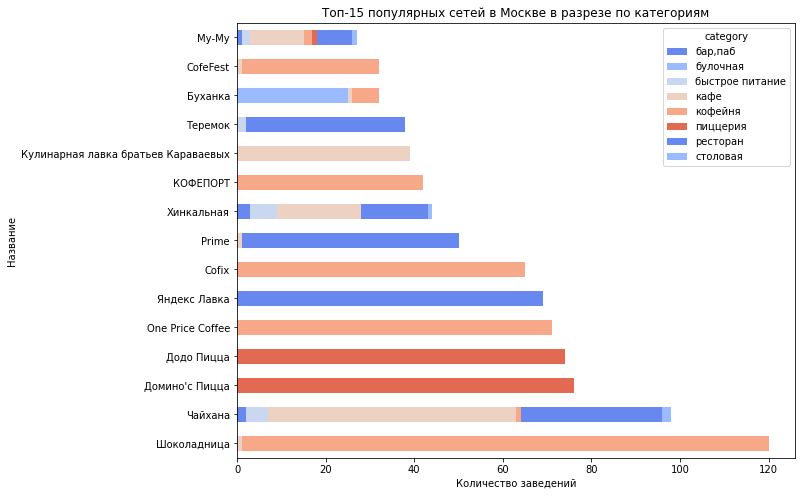

In [84]:
#график топ-15 заведений в разрезе по категориям заведений

(
    df.query('name in @top15_msc_chain_list')
    .pivot_table(index='name', columns='category', values='address', aggfunc='count').reindex(top15_msc_chain_list)
    .plot(kind='barh', stacked=True, figsize=(10, 8))
)


plt.title('Топ-15 популярных сетей в Москве в разрезе по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Название')
plt.show()

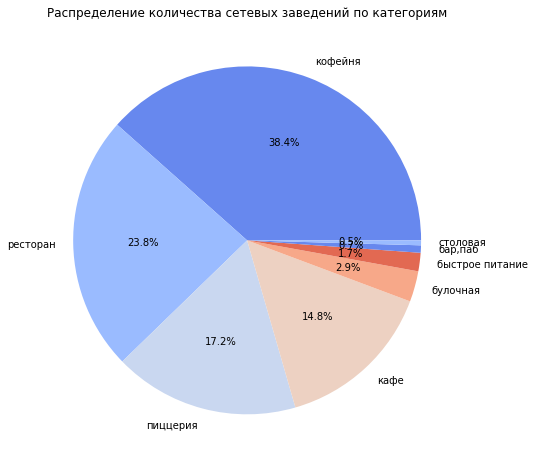

In [85]:
category_counts = df.query('name in @top15_msc_chain_list').groupby('category')['address'].count().sort_values(ascending=False)

plt.figure(figsize=(8, 8))
plt.pie(category_counts.values, labels=category_counts.index, colors=sns.color_palette('coolwarm'), autopct='%1.1f%%')

plt.title('Распределение количества сетевых заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество сетевых заведений')
plt.axis('off')

plt.show()

Самые популярные типы сетевых завдений: кофейня, ресторан, пиццерия. 

### Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам

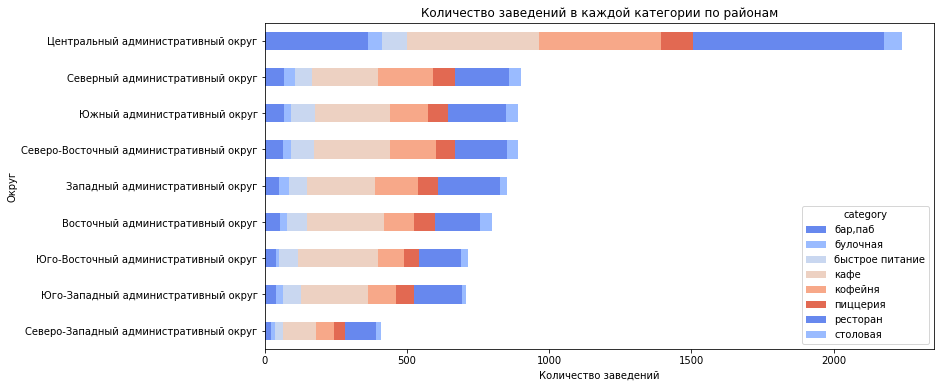

In [86]:
category_district= df.groupby('district')['name'].count().sort_values().index
(
    df.pivot_table(index='district', columns='category', values='name', aggfunc='count')
    .reindex(index=category_district)
    .plot(kind='barh', stacked=True, figsize=(12, 6))
)

plt.title('Количество заведений в каждой категории по районам')
plt.xlabel('Количество заведений')
plt.ylabel('Округ')
plt.show()

Видим, что в ЦАО наибольшее кол-во заведений, значительно больше баров, пабов, ресторанов.

### Распределение средних рейтингов. 

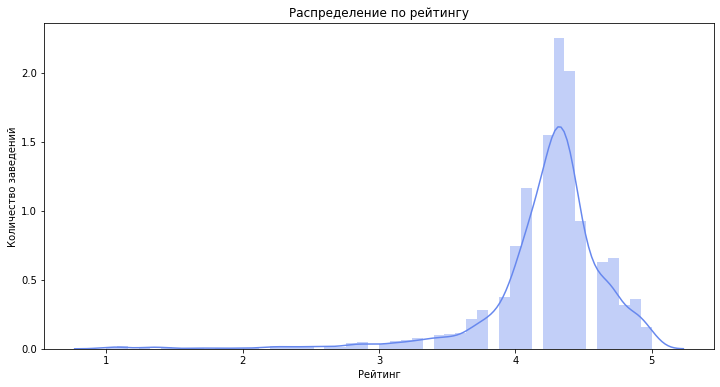

In [87]:
fig, ax = plt.subplots(figsize=(12, 6)) 
sns.distplot(df['rating'])
plt.title('Распределение по рейтингу')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений')
plt.show()

In [88]:
round(df['rating'].mean(),1)

4.2

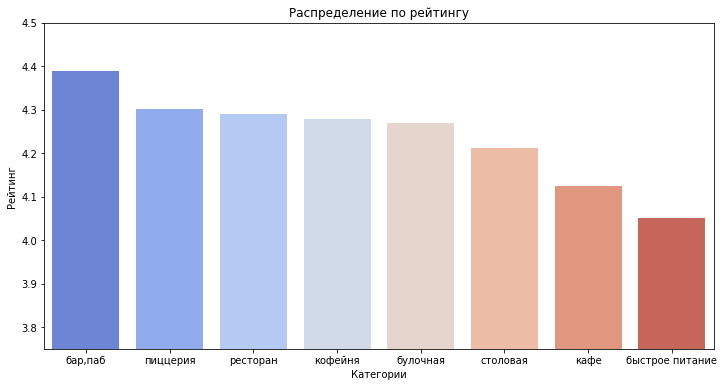

In [89]:
rating_by_category = df.groupby('category')['rating'].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=rating_by_category.index, y=rating_by_category.values, palette='coolwarm')
plt.ylim((3.75, 4.5))
plt.title('Распределение по рейтингу')
plt.xlabel('Категории')
plt.ylabel('Рейтинг')
plt.show()

Самые высокие рейтинги у баров,пабов, пиццерий и ресторанов. 

### Построим хороплет со средним рейтингом заведений каждого района

In [90]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [91]:
round(df['rating'].mean(),2)

4.23

In [92]:
location_rating = df.groupby('district', as_index=False)['rating'].mean()
location_rating.style.background_gradient(cmap='Blues')

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [93]:
Choropleth(
    geo_data=state_geo,
    data=location_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Видим, что в ЦАО в основном рейтинги выше. Ниже рейтинги у ЮВАО и СВАО.

### Найдем топ-15 улиц по количеству заведений. 

In [95]:
#посмотрим на топ-15 улиц и количество заведений на этих улицах
top15_street = (
    df.groupby('street')['name']
.count().sort_values(ascending=False).head(15).reset_index()
)
top15_street

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [96]:
#составим список улиц, к которому обратимся для построения графика
top15_street_list = top15_street['street']

In [97]:
top15_street_by_district = df.query('street in @top15_street_list').pivot_table(index='street', columns='category', values='name', aggfunc='count')
#добавим столбец с общим кол-вом заведений
top15_street_by_district['всего заведений'] = top15_street_by_district.sum(axis= 1)
#отсортируем по нему
top15_street_by_district = top15_street_by_district.sort_values(by='всего заведений')
#удалим этот столбец
top15_street_by_district = top15_street_by_district.drop('всего заведений', axis= 1)

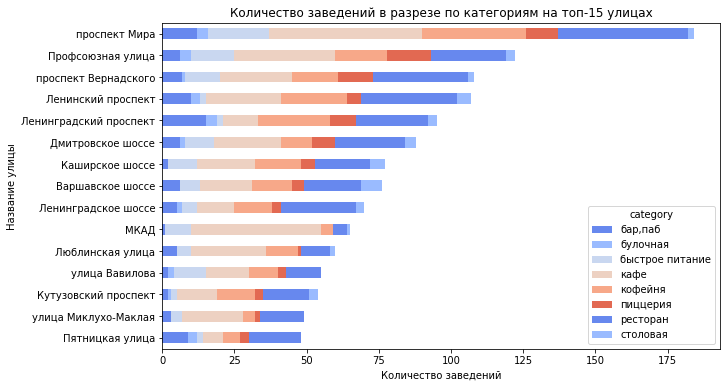

In [98]:
#график топ-15 улиц в разрезе по категориям заведений
top15_street_by_district.plot(kind='barh', stacked=True, figsize=(10, 6))
plt.title('Количество заведений в разрезе по категориям на топ-15 улицах')
plt.xlabel('Количество заведений')
plt.ylabel('Название улицы')
plt.show()

Видим, что на проспекте мира больше всего заведений, в основном: кафе, кофейни, рестораны. На МКАДе, например, практически отсутствуют бары и пабы.

### Найдем улицы, на которых находится только один объект общепита. 

In [99]:
#составим список улиц, к которому обратимся для построения графика
street_one_name = (
    df.groupby('street')
    .agg({'name': 'count'})
    .query('name == 1').index
)
street_one_name

Index(['1-й Автозаводский проезд', '1-й Балтийский переулок',
       '1-й Варшавский проезд', '1-й Вешняковский проезд',
       '1-й Голутвинский переулок', '1-й Грайвороновский проезд',
       '1-й Дербеневский переулок', '1-й Земельный переулок',
       '1-й Капотнинский проезд', '1-й Кирпичный переулок',
       ...
       'улица Уткина', 'улица Фадеева', 'улица Фотиевой', 'улица Чечулина',
       'улица Чистова', 'улица Шкулёва', 'улица Шкулёва 4', 'улица Шухова',
       'улица Юннатов', '№ 7'],
      dtype='object', name='street', length=458)

Предположим, что в основном это улицы в спальных районах с небольшим количеством заведений, проверим гипотезу.

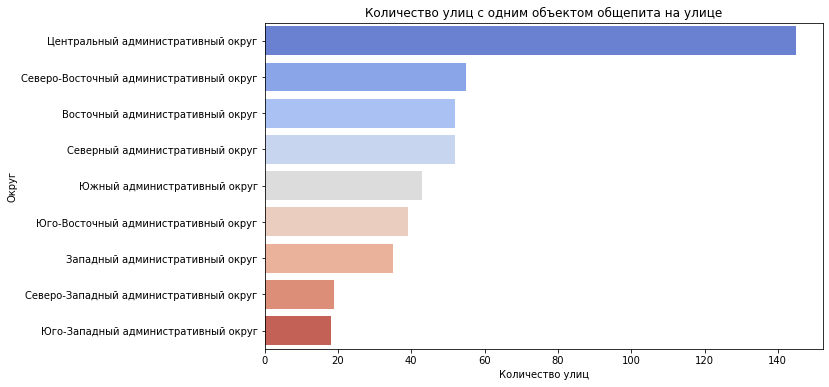

In [100]:
street_counts = (
    df.query('street in @street_one_name')
    .pivot_table(index='district', values='street', aggfunc='count')
    .sort_values(by='street', ascending=False)
)

plt.figure(figsize=(10, 6))
sns.barplot(data=street_counts, x='street', y=street_counts.index, palette='coolwarm')
plt.title('Количество улиц с одним объектом общепита на улице')
plt.xlabel('Количество улиц')
plt.ylabel('Округ')
plt.show()

Гипотеза не подтвердилась. Скорее всего улицы с единственным заведением - это маленькие улочки, которых больше в центре, из-за этого ЦАО заметно выделяется на графике.

### Средний чек заведений

In [101]:
#средний чек по всему датасету
df['middle_avg_bill'].median()

750.0

Посчитаем медиану столбца middle_avg_bill для каждого района.

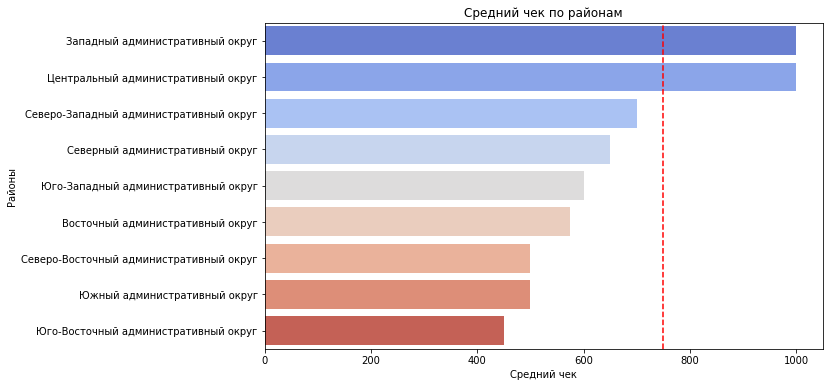

In [102]:
#средний чек по районам
district_median_bill = (df.groupby('district')['middle_avg_bill'].median().reset_index()
.sort_values(by='middle_avg_bill', ascending=False))

plt.figure(figsize=(10, 6))
sns.barplot(data=district_median_bill, x='middle_avg_bill', y='district', palette='coolwarm')
plt.title('Средний чек по районам')
plt.xlabel('Средний чек')
plt.ylabel('Районы')
plt.axvline(x=750, color='red', linestyle='--')
plt.show()

In [103]:
map = Map(location=[moscow_lat, moscow_lng], zoom_start=11)
marker_cluster = MarkerCluster().add_to(map)

Choropleth(
    geo_data=state_geo,
    data=district_median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведения по районам',
).add_to(map)

def create_clust(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['district']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

df.apply(create_clust, axis=1)
map

Средний чек ЦАО и ЗАО значительно выше, чем у других районов.

**Вывод:**

В ходе исследования рынка заведений общепита Москвы были сделаны следующие выводы:

В данных представлено 8 типов заведения: *кафе, ресторан, кофейня, пиццерия, бар,паб, быстрое питание, булочная, столовая*. 

В топ-3 заведений по категориям входят: *кафе, ресторан и кофейня*.
Большинство заведений в датасете являются несетевыми: их больше во всех категориях кроме: кофейня, пиццерия, булочная.

Средний рейтинг у заведений составляет 4,3. Видим, что в ЦАО в основном рейтинги выше. Ниже рейтинги у ЮВАО и СВАО.
Топ-3 сетевых заведения: Шоколадница, Чайхана, Доминос Пицца.

Средний чек по всей Москве - 750 руб. Самый высокий средний чек у ЗАО и ЦАО - равен 1000 руб., самый низкий - у ЮВАО - 450 руб.

Большое количество улиц лишь с единственным заведением находятся в ЦАО.

Средний чек ЦАО и ЗАО значительно выше, чем у других районов. Самый низкий чек у ЮВАО.

## Детализируем исследование: открытие кофейни

### Количество кофеен в датасете

In [104]:
coffeshops = df.query('category == "кофейня"')
coffeshops['name'].count()

1413

In [105]:
coffeshops['name'].count()/df['name'].count()

0.16809421841541755

### Расположение кофеен

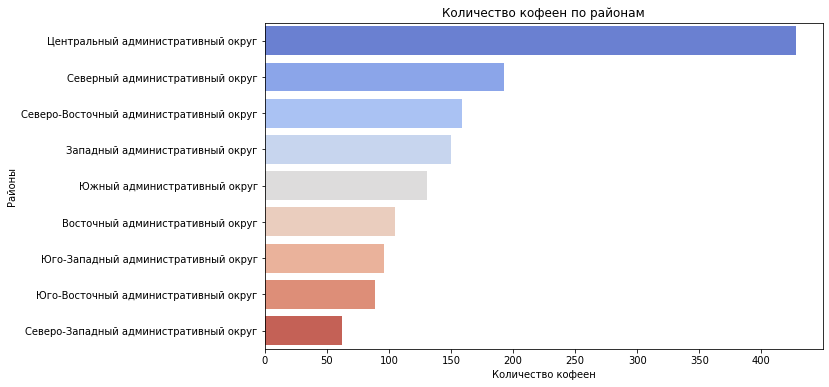

In [106]:
#посмотрим на расположение кофеен
coffee_shops_by_district = (coffeshops.pivot_table(index='district', values='name', aggfunc='count')
.sort_values(by='name', ascending=False))

plt.figure(figsize=(10, 6))
sns.barplot(data=coffee_shops_by_district, x='name', y=coffee_shops_by_district.index, palette='coolwarm')
plt.title('Количество кофеен по районам')
plt.xlabel('Количество кофеен')
plt.ylabel('Районы')
plt.show()

Большинство кофеен расположено в ЦАО (как и других заведений). Связано это с высокой проходимостью

### Посмотрим, есть ли круглосуточные кофейни

In [107]:
coffeshops['is_24/7'] = coffeshops['is_24/7'].replace(False, 'Некруглосуточно')
coffeshops['is_24/7'] = coffeshops['is_24/7'].replace(True, 'Круглосуточно')

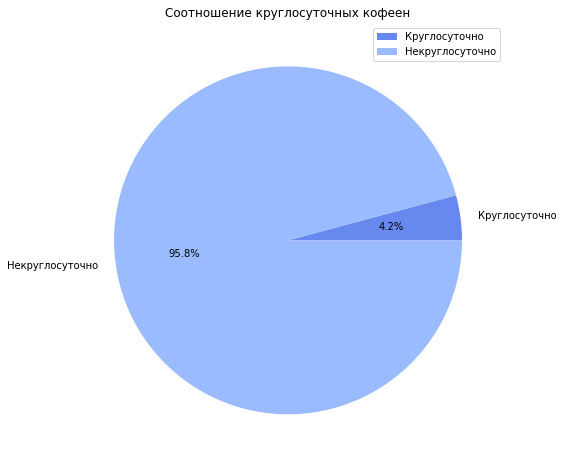

In [175]:
coffeshops.pivot_table(index='is_24/7', values='name', aggfunc='count').plot(kind='pie', 
                                                                             y='name', figsize=(8, 8), 
                                                                             autopct='%1.1f%%',
                                                                            colors=sns.color_palette('coolwarm'))
plt.title('Соотношение круглосуточных кофеен')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.axis('off')

plt.show()

Основня часть кофеен работает не круглосуточно скорее всего из-за формата заведения.

### Как  распределяются рейтинги кофеен по районам

In [109]:
#средний рейтинг кофеен
avg_coffeshops_rating = round(coffeshops['rating'].mean(),2)
avg_coffeshops_rating

4.28

In [110]:
coffeshops_rating = (
coffeshops.groupby('district', as_index=False)['rating'].mean()
    .sort_values(by='rating', ascending=False)
)    
coffeshops_rating.style.background_gradient(cmap='Blues')

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


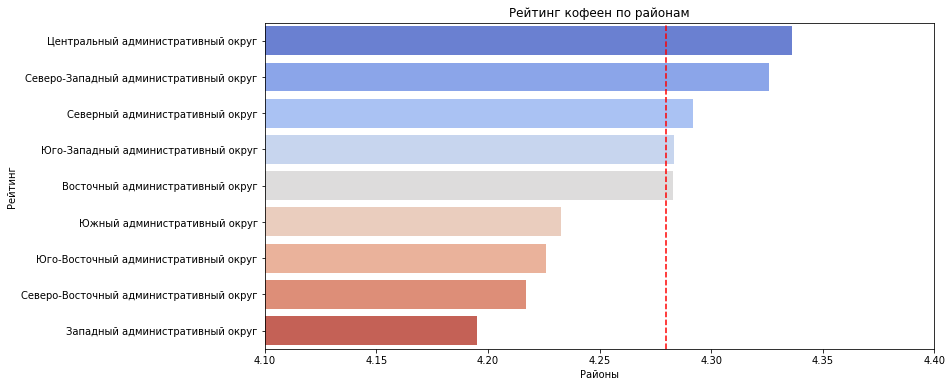

In [111]:
plt.figure(figsize=(12, 6))
sns.barplot(data=coffeshops_rating, x='rating', y='district', palette='coolwarm')

plt.xlim((4.1,4.4))
plt.axvline(x=avg_coffeshops_rating, color='red', linestyle='--')
plt.title('Рейтинг кофеен по районам')
plt.xlabel('Районы')
plt.ylabel('Рейтинг')
plt.show()

Средний рейтинг по кофейням - 4.28. У ЦАО, СЗАО и САО рейтинги выше среднего. У ЗАО самые худшие рейтинги.

### На какую стоимость чашки капучино стоит ориентироваться при открытии

In [112]:
#xсоздаем хороплет
coffeshops_map = Map(location=[moscow_lat, moscow_lng], zoom_start=11)
marker_cluster = MarkerCluster().add_to(coffeshops_map)

Choropleth(
    geo_data=state_geo,
    data=coffeshops_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам Москвы',
).add_to(coffeshops_map)

# выводим карту
coffeshops_map

In [113]:
coffeshops['middle_coffee_cup'].median()

170.0

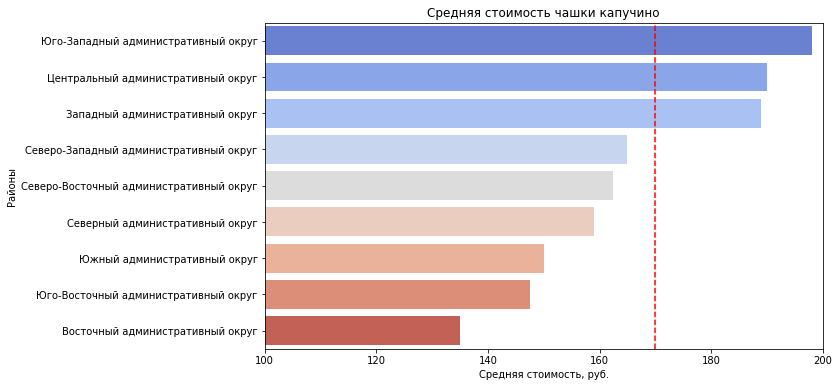

In [114]:
#средний чек по районам
coffeshops_bill = (coffeshops.groupby('district')['middle_coffee_cup'].median().reset_index()
.sort_values(by='middle_coffee_cup', ascending=False))

plt.figure(figsize=(10, 6))
sns.barplot(data=coffeshops_bill, x='middle_coffee_cup', y='district', palette='coolwarm')
plt.axvline(coffeshops['middle_coffee_cup'].median(), color='red', linestyle='--')
plt.xlim((100, 200))
plt.title('Средняя стоимость чашки капучино')
plt.xlabel('Средняя стоимость, руб.')
plt.ylabel('Районы')
plt.show()

In [115]:
map_avg_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=11)
marker_cluster = MarkerCluster().add_to(map_avg_bill)

Choropleth(
    geo_data=state_geo,
    data=coffeshops_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек кофейни по районам',
).add_to(map_avg_bill)

def create_clust(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['district']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

df.apply(create_clust, axis=1)
map_avg_bill

Средняя чашка капучино по всем кофейням составляет 170 руб. Выше среднего цена на кофе у ЮЗАО, ЦАО и ЗАО. Самая низкая цена - у ВАО.

Ориентироваться на средниюю стоимость чашки капучино лучше в зависимости от того, в каком районе открывается кафе. Например, мы видим что в ЗАО и ЦАО самые высокие средние чеки (500-600 руб.) - чтобы покрыть расходы на аренду, бизнес увеличивает стоимость товара. 